# Import dependencies

In [1]:
#!pip install category_encoders

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score

In [3]:
df = pd.read_excel('furniture sales\Sample - Superstore-newdate.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,2698,CA-2014-145317,2020-03-16,2020-03-21,Standard Class,SM-20320,Sean Miller,Home Office,United States,Jacksonville,...,32216,South,TEC-MA-10002412,Technology,Machines,Cisco TelePresence System EX90 Videoconferenci...,22638.480,6,0.5,-1811.0784
1,6827,CA-2016-118689,2022-10-01,2022-10-08,Standard Class,TC-20980,Tamara Chand,Corporate,United States,Lafayette,...,47905,Central,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,17499.950,5,0.0,8399.9760
2,8154,CA-2017-140151,2023-03-22,2023-03-24,First Class,RB-19360,Raymond Buch,Consumer,United States,Seattle,...,98115,West,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,13999.960,4,0.0,6719.9808
3,2624,CA-2017-127180,2023-10-21,2023-10-23,First Class,TA-21385,Tom Ashbrook,Home Office,United States,New York City,...,10024,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,11199.968,4,0.2,3919.9888
4,4191,CA-2017-166709,2023-11-16,2023-11-21,Standard Class,HL-15040,Hunter Lopez,Consumer,United States,Newark,...,19711,East,TEC-CO-10004722,Technology,Copiers,Canon imageCLASS 2200 Advanced Copier,10499.970,3,0.0,5039.9856


In [4]:
df['per_unit_price'] = df['Sales'] / df['Quantity']
df['per_unit_profit'] = df['Profit'] / df['Quantity']
df['Profit_margin'] = df['Profit'] / df['Sales']
df['Original_Price'] = df['Sales'] / (1 - df['Discount'])
df['original_per_unit_price'] = df['Original_Price'] / df['Quantity']

In [5]:
df['order_month'] = df['Order Date'].dt.month
df['order_year'] = df['Order Date'].dt.year

In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
def analyze_and_filter_column(df, column_name):
    # Convert column to list and plot boxplot
    column_data = df[column_name].tolist()
    fig, ax = plt.subplots()
    ax.set_title(f'{column_name} Boxplot')
    ax.set_ylabel(column_name)
    ax.boxplot(column_data)
    plt.show()

    # Calculate quartiles and IQR
    quartiles = df[column_name].quantile([.25, .5, .75])
    lowerq = quartiles[0.25]
    upperq = quartiles[0.75]
    iqr = upperq - lowerq

    # Print quartile information
    print(f"The lower quartile of {column_name} is: {lowerq}")
    print(f"The upper quartile of {column_name} is: {upperq}")
    print(f"The interquartile range of {column_name} is: {iqr}")
    print(f"The median of {column_name} is: {quartiles[0.5]} ")

    # Identify potential outliers
    lower_bound = lowerq - (1.5 * iqr)
    upper_bound = upperq + (1.5 * iqr)
    print(f"Values below {lower_bound} could be outliers.")
    print(f"Values above {upper_bound} could be outliers.")

    # Filter out potential outliers
    df_filtered = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]
    df_filtered = df_filtered.copy()

    # Return the filtered and binned DataFrame
    return df_filtered

In [8]:
column_name = 'Original_Price'
df = df.copy()
df = analyze_and_filter_column(df, column_name)

The lower quartile of Original_Price is: 21.36
The upper quartile of Original_Price is: 251.91
The interquartile range of Original_Price is: 230.55
The median of Original_Price is: 64.96 
Values below -324.46500000000003 could be outliers.
Values above 597.735 could be outliers.


C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\1531172447.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [9]:
df = df.drop(columns=["Discount", 'Row ID', 'Postal Code', 'Sales', 'Profit', 'per_unit_profit', 'Profit_margin',
                      "original_per_unit_price", "Order ID",'State', "Customer ID", "City", "Product ID", 
                      'per_unit_price','Country',"Customer Name","Ship Date",'Ship Mode','Segment'
                     ,'Order Date','Product Name'])

In [10]:
df = df.groupby(['order_year','order_month','Region','Category','Sub-Category'])['Original_Price'].sum().reset_index()

In [11]:
df

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28
...,...,...,...,...,...,...
2311,2023,12,West,Office Supplies,Paper,1392.38
2312,2023,12,West,Office Supplies,Storage,2430.64
2313,2023,12,West,Office Supplies,Supplies,73.13
2314,2023,12,West,Technology,Accessories,1387.72


In [12]:
df_2 = df.copy()

In [13]:
df.head()

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28


In [14]:
df = pd.get_dummies(df, columns=['Region','Category','Sub-Category'])

In [15]:
description = df.describe()
description

,order_year,order_month,Original_Price,Region_Central,Region_East,Region_South,Region_West,Category_Furniture,Category_Office Supplies,Category_Technology,...,Sub-Category_Envelopes,Sub-Category_Fasteners,Sub-Category_Furnishings,Sub-Category_Labels,Sub-Category_Machines,Sub-Category_Paper,Sub-Category_Phones,Sub-Category_Storage,Sub-Category_Supplies,Sub-Category_Tables
count,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,...,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000
mean,2021.565630,6.901554,419.493472,0.250000,0.259931,0.220207,0.269862,0.231865,0.599309,0.168826,...,0.055699,0.054404,0.079447,0.063903,0.014249,0.081606,0.075130,0.072539,0.045769,0.041451
std,1.124828,3.389321,453.746417,0.433106,0.438691,0.414476,0.443984,0.422115,0.490144,0.374679,...,0.229390,0.226862,0.270494,0.244633,0.118540,0.273823,0.263657,0.259434,0.209028,0.199373
min,2020.000000,1.000000,2.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2021.000000,4.000000,79.955000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2022.000000,7.000000,272.955000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2023.000000,10.000000,605.067500,0.250000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2023.000000,12.000000,3055.240000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
target = 'Original_Price'
features = df.columns.drop(target)
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.75, test_size=0.25, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1737, 26), (579, 26), (1737,), (579,))

In [17]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [18]:
model.score(X_test, y_test)

0.40267802036208056

In [19]:
df_2.head()

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28


In [20]:
df_2.describe()

,order_year,order_month,Original_Price
count,2316.000000,2316.000000,2316.000000
mean,2021.565630,6.901554,419.493472
std,1.124828,3.389321,453.746417
min,2020.000000,1.000000,2.040000
25%,2021.000000,4.000000,79.955000
50%,2022.000000,7.000000,272.955000
75%,2023.000000,10.000000,605.067500
max,2023.000000,12.000000,3055.240000


In [21]:
#assert df.shape == (2316, 28)

In [22]:
#assert df_2.shape == (2316, 7)

In [23]:
from sklearn.metrics import mean_absolute_error, r2_score
target = 'Original_Price'
y = df_2[target]
y_pred = [y.mean()] * len(y)
print('Mean Baseline:')
print('Mean Absolute Error', mean_absolute_error(y, y_pred))
print('R^2 score', r2_score(y, y_pred))

Mean Baseline:
Mean Absolute Error 338.12715571782695
R^2 score 0.0


In [24]:
#train = df_2[df_2['order_year'] <= 2021]
#val = df_2[df_2['order_year'] == 2022]
#test = df_2[df_2['order_year'] == 2023]
#train.shape, val.shape, test.shape

In [25]:
#random split of the dataset in three sections

# The splits are 60% training, 20% validation, and 20% test

# First, split the data into training and a temporary set (combining validation and test)
train, temp_df = train_test_split(df_2, test_size=0.34, random_state=42)  # 34% training, 66% temp

# Then, split the temporary set into validation and test sets
val, test = train_test_split(temp_df, test_size=0.5, random_state=42)  # Splits the temp into 50% validation, 50% test

In [26]:
import pandas_profiling
train.profile_report()

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\2522532513.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
features = ['Region','Category','Sub-Category']
target = 'Original_Price'

X_train = train[features]
X_val = val[features]
X_test = test[features]

y_train = train[target] 
y_val = val[target]
y_test = test[target]

In [28]:
# category_encoders is recommended, but not required
import category_encoders as ce

In [29]:
# use fit_transform method with train set
# use transform method with val / test sets 
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

In [30]:
X_train_encoded.head()

,Region_Central,Region_South,Region_East,Region_West,Category_Technology,Category_Office Supplies,Category_Furniture,Sub-Category_Accessories,Sub-Category_Appliances,Sub-Category_Envelopes,...,Sub-Category_Bookcases,Sub-Category_Binders,Sub-Category_Fasteners,Sub-Category_Paper,Sub-Category_Supplies,Sub-Category_Furnishings,Sub-Category_Copiers,Sub-Category_Labels,Sub-Category_Chairs,Sub-Category_Tables
942,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
365,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1234,0,0,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1345,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1037,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
# You should scale features when doing regularized regression,
# but it's not required for this Sprint Challenge

from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train)

RidgeCV()

In [32]:
X_train_scaled

array([[ 1.68785855, -0.53092296, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671, -0.53092296,  1.72004338, ..., -0.26462806,
        -0.26320945, -0.20040802],
       ...,
       [ 1.68785855, -0.53092296, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802]])

In [33]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
from sklearn.metrics import mean_absolute_error, r2_score

y_pred = ridge.predict(X_val_scaled)
print('Ridge Regression:')
print('Mean Absolute Error', mean_absolute_error(y_val, y_pred))
print('R^2 score', r2_score(y_val, y_pred))

Ridge Regression:
Mean Absolute Error 239.74748270726334
R^2 score 0.31230592833228066


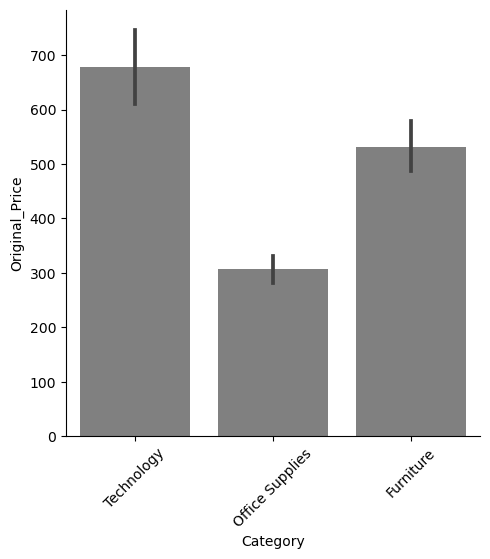

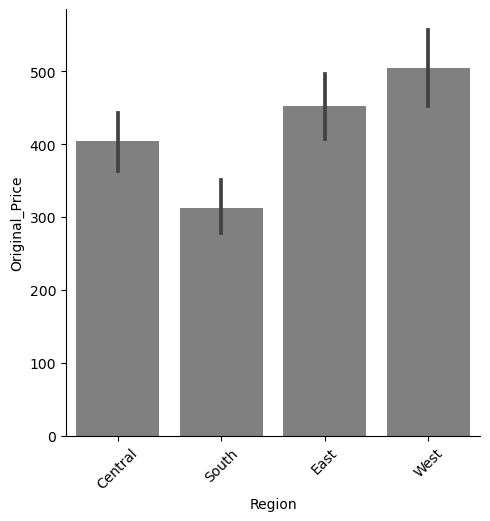

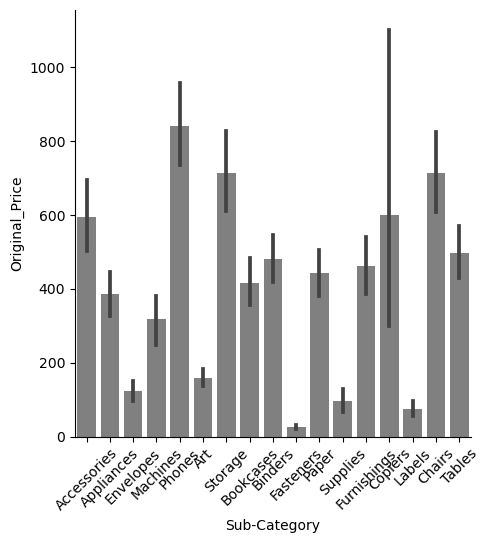

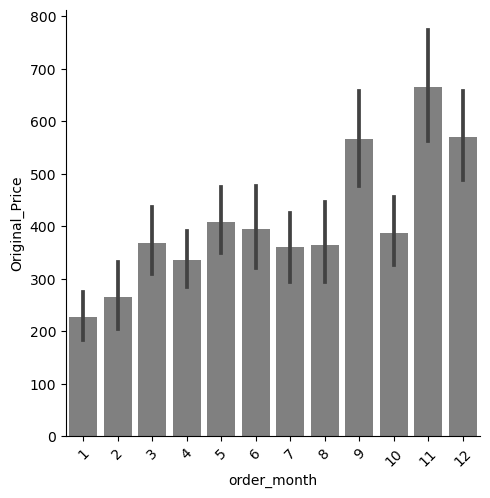

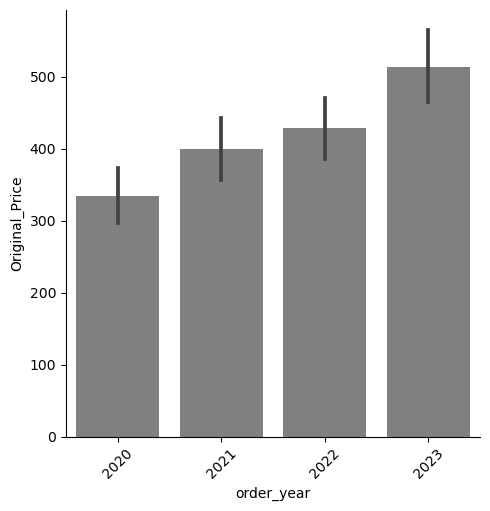

In [34]:
# Make visualizations to explore relationships between features and target
# You can visualize many features, or just a few.
# You do not need to use Seaborn, but it includes confidence intervals.
# Plotly and Pandas are also great for exploratory plots.

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

for col in sorted(train.columns):
    if train[col].nunique() <= 20:
        sns.catplot(x=col, y='Original_Price', data=train, kind='bar', color='grey')
        plt.xticks(rotation=45)
        plt.show()

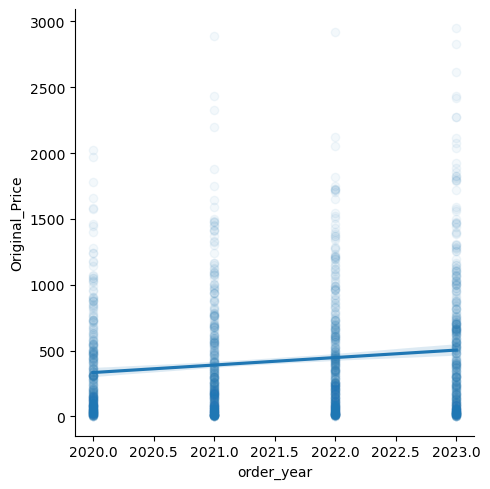

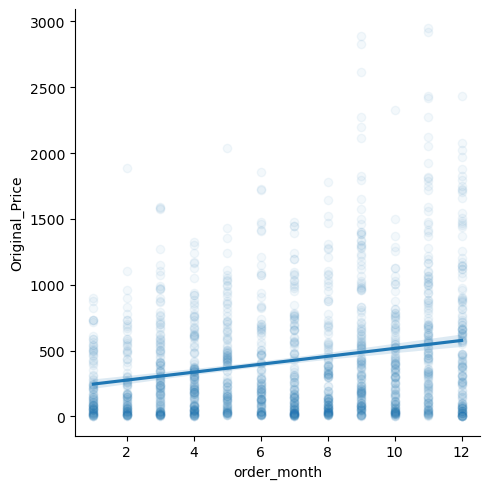

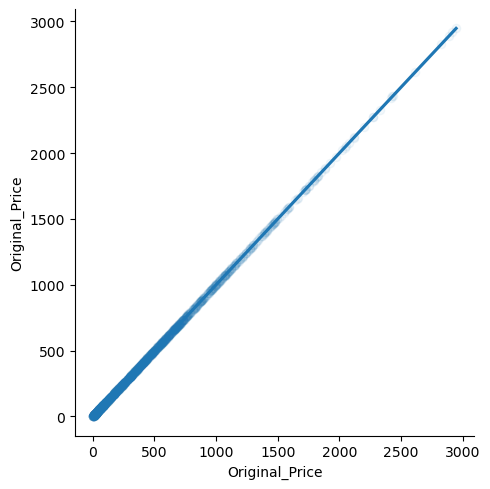

In [35]:
# Make visualizations to explore relationships between features and target

numeric = train.select_dtypes('number')
for feature in numeric:
    sns.lmplot(x=feature, y=target, data=train, scatter_kws={'alpha':0.05})
    plt.show()

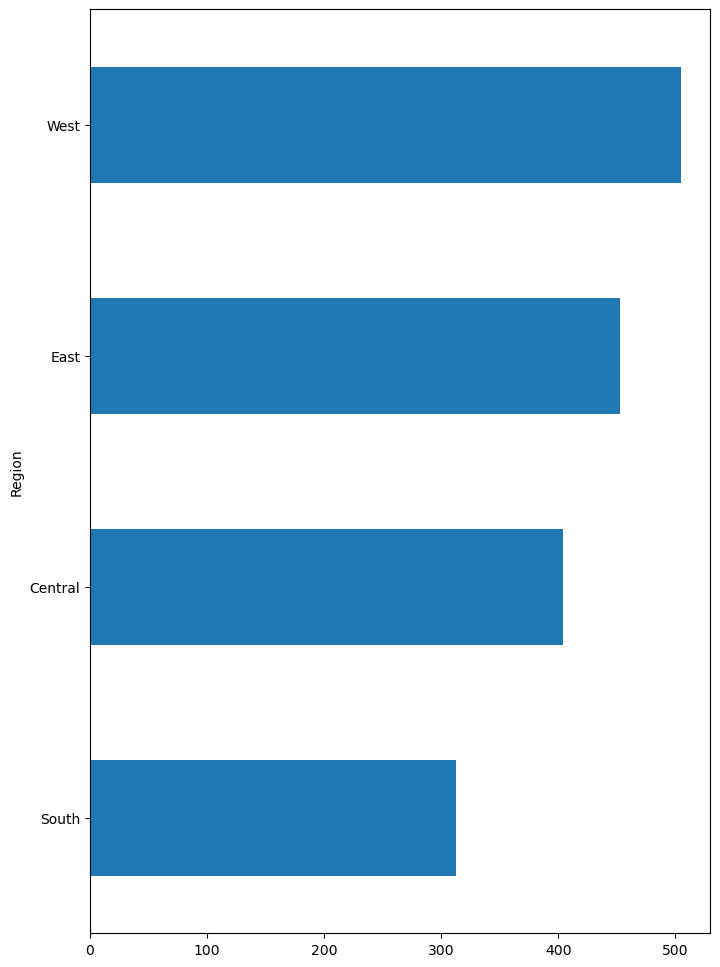

In [36]:
# Make visualizations to explore relationships between features and target
plt.figure(figsize=(8,12))
train.groupby('Region')['Original_Price'].mean().sort_values().plot.barh();

In [37]:
# For this stretch goal, students only have to report validation MAE and R^2 
# But this function goes further: RMSE, MAE, R^2, for train & validation sets.

import numpy as np
from sklearn.metrics import mean_squared_error

def lr(train, val, features, target):
    X_train = train[features]
    y_train = train[target]
    X_val = val[features]
    y_val = val[target]

    encoder = ce.OneHotEncoder(use_cat_names=True)
    model = LinearRegression()
    X_train_encoded = encoder.fit_transform(X_train)
    X_val_encoded = encoder.transform(X_val)
    model.fit(X_train_encoded, y_train)
    y_pred_train = model.predict(X_train_encoded)
    y_pred_val = model.predict(X_val_encoded)

    print(f'Linear Regression with {len(features)} features: {features}')
    print('Train Root Mean Squared Error:', 
          np.sqrt(mean_squared_error(y_train, y_pred_train)))
    print('Validation Root Mean Square Error:', 
          np.sqrt(mean_squared_error(y_val, y_pred_val)))
    print('Train Mean Absolute Error:', 
          mean_absolute_error(y_train, y_pred_train))
    print('Validation Mean Absolute Error:', 
          mean_absolute_error(y_val, y_pred_val))
    print('Train R^2 Score:', 
          r2_score(y_train, y_pred_train))
    print('Validation R^2 Score:', 
          r2_score(y_val, y_pred_val))

In [38]:
# Just 1 feature
features = ['Category']
lr(train, val, features, target)

Linear Regression with 1 features: ['Category']
Train Root Mean Squared Error: 432.6991856946934
Validation Root Mean Square Error: 380.0280973191725
Train Mean Absolute Error: 317.70237565445024
Validation Mean Absolute Error: 287.32530456852794
Train R^2 Score: 0.10602746987875311
Validation R^2 Score: 0.12742010008233629


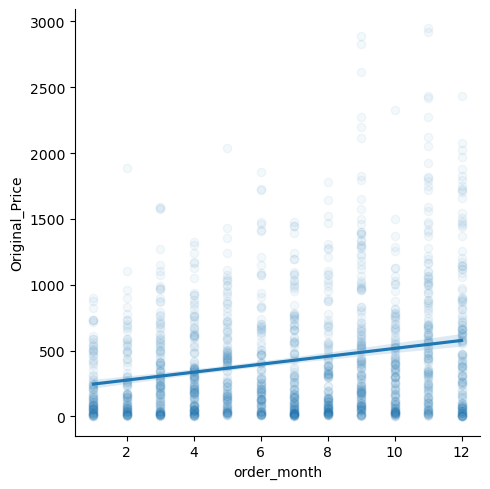

In [39]:
# First, we'll wrangle a feature ...
# In the EDA viz, the line of best fit seemed wrong for 'Lot_Area', 
# like it was influenced by outliers
sns.lmplot(x='order_month', y=target, data=train, scatter_kws={'alpha':0.05});

In [40]:
# This certainly isn't required, but we'll wrangle this feature:
def wrangle(X):
    X = X.copy()
    X['Original_Price_Clipped'] = X['Original_Price'].clip(lower=0, upper=4000)
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

In [41]:
# Before:
features = ['Original_Price']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price']
Train Root Mean Squared Error: 2.044571797481042e-13
Validation Root Mean Square Error: 1.8691300011844495e-13
Train Mean Absolute Error: 1.4340710120281198e-13
Validation Mean Absolute Error: 1.362238015565196e-13
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


In [42]:
# After:
features = ['Original_Price_Clipped']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price_Clipped']
Train Root Mean Squared Error: 2.044571797481042e-13
Validation Root Mean Square Error: 1.8691300011844495e-13
Train Mean Absolute Error: 1.4340710120281198e-13
Validation Mean Absolute Error: 1.362238015565196e-13
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


In [43]:
# 2. Automatically select features, then do ridge regression

from sklearn.feature_selection import f_regression, SelectKBest

# Arrange X, y
features = train.columns.drop([target, 'Original_Price_Clipped'])
X_train = train[features]
X_val = val[features]

# One-hot encode
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

# Next sprint, to do hyperparameter optimization, 
# we'll use RandomizedSearchCV instead of for loops
ks = range(1, len(X_train_encoded.columns)+1)
maes = []
for k in ks:
    # Select K best features
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_scaled, y_train)
    X_val_selected = selector.transform(X_val_scaled)
    
    # Fit Ridge Regression, use cross-validation to optimize alpha
    model = RidgeCV()
    model.fit(X_train_selected, y_train)
    
    # Get Validation MAE
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    maes.append(mae)

    
print('Best K & Validation MAE:')
[(k, mae) for k, mae in zip(ks, maes) if mae==min(maes)]

Best K & Validation MAE:


[(12, 230.0093675931543)]

In [44]:
# Report test MAE, R^2 for final model

X_train = train[features]
X_test = test[features]

encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

selector = SelectKBest(score_func=f_regression, k=26)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_val_scaled)

model = RidgeCV()
model.fit(X_train_encoded, y_train)
y_pred_test = model.predict(X_test_encoded)

print(f'Ridge Regression, final model')
print('Test Mean Absolute Error:', mean_absolute_error(y_test, y_pred_test))
print('Test R^2 Score:', r2_score(y_test, y_pred_test))

Ridge Regression, final model
Test Mean Absolute Error: 253.89355692237166
Test R^2 Score: 0.4115630929962175


In [45]:
# Print coefficients for the features
print('Intercept', model.intercept_)
coefficients = pd.Series(model.coef_, X_train_encoded.columns)
print(coefficients.to_string())

Intercept -119349.28839730525
order_year                   59.136724
order_month                  33.741750
Region_Central               -9.966391
Region_South               -118.537917
Region_East                  25.210497
Region_West                 103.293811
Category_Technology          86.423414
Category_Office Supplies   -145.999956
Category_Furniture           59.576542
Sub-Category_Accessories     75.939407
Sub-Category_Appliances      86.038501
Sub-Category_Envelopes     -170.293653
Sub-Category_Machines      -261.661247
Sub-Category_Phones         327.667453
Sub-Category_Art           -114.098417
Sub-Category_Storage        420.834152
Sub-Category_Bookcases     -103.331399
Sub-Category_Binders        205.572363
Sub-Category_Fasteners     -284.492662
Sub-Category_Paper          172.998524
Sub-Category_Supplies      -247.786950
Sub-Category_Furnishings    -19.959008
Sub-Category_Copiers        -55.522199
Sub-Category_Labels        -214.771815
Sub-Category_Chairs         222.82

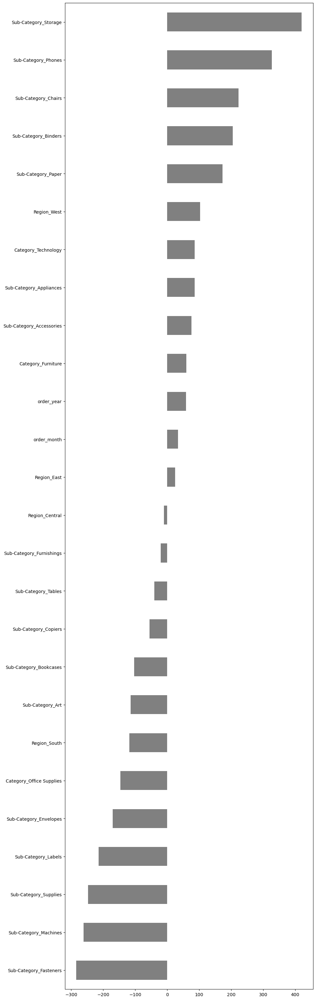

In [46]:
# Or, plot coefficients
%matplotlib inline
coefficients.sort_values().plot.barh(color='grey', figsize=(10,40));

In [47]:
import joblib
# Save the model
joblib.dump(model, 'model_sales.joblib')

['model_sales.joblib']

In [48]:
# Load the sales model 
loaded_model_sales = joblib.load('model_sales.joblib')

In [49]:
X_train_encoded
X_train_encoded.head()

,order_year,order_month,Region_Central,Region_South,Region_East,Region_West,Category_Technology,Category_Office Supplies,Category_Furniture,Sub-Category_Accessories,...,Sub-Category_Bookcases,Sub-Category_Binders,Sub-Category_Fasteners,Sub-Category_Paper,Sub-Category_Supplies,Sub-Category_Furnishings,Sub-Category_Copiers,Sub-Category_Labels,Sub-Category_Chairs,Sub-Category_Tables
942,2021,10,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
365,2020,9,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1234,2022,4,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1345,2022,6,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1037,2021,11,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [50]:
model_features = X_train_encoded.columns.tolist()

In [51]:
# Get the list of unique categories for 'Category'
category_columns = [col for col in df.columns if 'Region_' in col]
unique_categories = [col.split('_')[-1] for col in category_columns]
print(unique_categories)
# Get the list of unique subcategories for 'Subcategory'
subcategory_columns = [col for col in df.columns if 'Category_' in col]
unique_subcategories = [col.split('_')[-1] for col in subcategory_columns]
print(unique_subcategories)
# Get the list of unique states for 'State'
state_columns = [col for col in df.columns if 'Sub-Category_' in col]
unique_states = [col.split('_')[-1] for col in state_columns]
print(unique_states)
last_known_year = 2023

# Generating future months and years
future_months = np.arange(1, 13)
future_years = np.full(shape=(12,), fill_value=last_known_year + 1)

# Prepare an empty DataFrame to collect all predictions
all_predictions = pd.DataFrame()

for category in unique_categories:
    for subcategory in unique_subcategories:
        for state in unique_states:
            # Creating a DataFrame for future data for each category, subcategory, and state
            future_data = pd.DataFrame({
                'order_month': future_months,
                'order_year': future_years,
                # Add other necessary features or assumed values
            })
            
            # One-hot encode Category, Subcategory, and State if they were one-hot encoded during training
            temp_data = pd.concat([future_data, pd.get_dummies(pd.DataFrame({
                'Region': [category] * len(future_data),
                'Category': [subcategory] * len(future_data),
                'Sub_Category': [state] * len(future_data)
            }))], axis=1)
            print(temp_data)
            # Add any missing columns that were present in the training data
            for feature in model_features:
                if feature not in temp_data.columns:
                    temp_data[feature] = 0  # Or use some other method to estimate this feature
            
            # Ensure the order of columns matches the training data
            temp_data = temp_data[model_features]
            
            # Check the structure of future_data
            print(f"Structure for {category}, {subcategory}, {state}:")
            print(future_data.head())
            
            # Predicting future sales and quantity
            temp_data['Predicted Sales'] = loaded_model_sales.predict(temp_data)
            
            # Store the prediction results
            all_predictions = all_predictions.append(temp_data)

# Display or further process the collected predictions
print(all_predictions)

['Central', 'East', 'South', 'West']
['Furniture', 'Office Supplies', 'Technology', 'Accessories', 'Appliances', 'Art', 'Binders', 'Bookcases', 'Chairs', 'Copiers', 'Envelopes', 'Fasteners', 'Furnishings', 'Labels', 'Machines', 'Paper', 'Phones', 'Storage', 'Supplies', 'Tables']
['Accessories', 'Appliances', 'Art', 'Binders', 'Bookcases', 'Chairs', 'Copiers', 'Envelopes', 'Fasteners', 'Furnishings', 'Labels', 'Machines', 'Paper', 'Phones', 'Storage', 'Supplies', 'Tables']
    order_month  order_year  Region_Central  Category_Furniture  \
0             1        2024               1                   1   
1             2        2024               1                   1   
2             3        2024               1                   1   
3             4        2024               1                   1   
4             5        2024               1                   1   
5             6        2024               1                   1   
6             7        2024               1           

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_Central  Category_Office Supplies  \
0             1        2024               1                         1   
1             2        2024               1                         1   
2             3        2024               1                         1   
3             4        2024               1                         1   
4             5        2024               1                         1   
5             6        2024               1                         1   
6             7        2024               1                         1   
7             8        2024               1                         1   
8             9        2024               1                         1   
9            10        2024               1                         1   
10           11        2024               1                         1   
11           12        2024               1                         1   

    Sub_Category_Storage  
0                      

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_Central  Category_Accessories  \
0             1        2024               1                     1   
1             2        2024               1                     1   
2             3        2024               1                     1   
3             4        2024               1                     1   
4             5        2024               1                     1   
5             6        2024               1                     1   
6             7        2024               1                     1   
7             8        2024               1                     1   
8             9        2024               1                     1   
9            10        2024               1                     1   
10           11        2024               1                     1   
11           12        2024               1                     1   

    Sub_Category_Chairs  
0                     1  
1                     1  
2                     1 

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_Central  Category_Art  Sub_Category_Art
0             1        2024               1             1                 1
1             2        2024               1             1                 1
2             3        2024               1             1                 1
3             4        2024               1             1                 1
4             5        2024               1             1                 1
5             6        2024               1             1                 1
6             7        2024               1             1                 1
7             8        2024               1             1                 1
8             9        2024               1             1                 1
9            10        2024               1             1                 1
10           11        2024               1             1                 1
11           12        2024               1             1                 1
Structure fo

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_Central  Category_Bookcases  \
0             1        2024               1                   1   
1             2        2024               1                   1   
2             3        2024               1                   1   
3             4        2024               1                   1   
4             5        2024               1                   1   
5             6        2024               1                   1   
6             7        2024               1                   1   
7             8        2024               1                   1   
8             9        2024               1                   1   
9            10        2024               1                   1   
10           11        2024               1                   1   
11           12        2024               1                   1   

    Sub_Category_Binders  
0                      1  
1                      1  
2                      1  
3                   

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Copiers, Appliances:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Copiers  \
0             1        2024               1                 1   
1             2        2024               1                 1   
2             3        2024               1                 1   
3             4        2024               1                 1   
4             5        2024               1                 1   
5             6        2024               1                 1   
6             7        2024               1                 1   
7             8        2024               1                 1   
8             9        2024               1                 1   
9            10        2024               1                 1   
10           11        2024               1                 1   
11           1

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Fasteners, Accessories:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Fasteners  \
0             1        2024               1                   1   
1             2        2024               1                   1   
2             3        2024               1                   1   
3             4        2024               1                   1   
4             5        2024               1                   1   
5             6        2024               1                   1   
6             7        2024               1                   1   
7             8        2024               1                   1   
8             9        2024               1                   1   
9            10        2024               1                   1   
10           11        2024               1           

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Furnishings, Tables:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Labels  \
0             1        2024               1                1   
1             2        2024               1                1   
2             3        2024               1                1   
3             4        2024               1                1   
4             5        2024               1                1   
5             6        2024               1                1   
6             7        2024               1                1   
7             8        2024               1                1   
8             9        2024               1                1   
9            10        2024               1                1   
10           11        2024               1                1   
11           12        202

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Machines, Storage:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Machines  \
0             1        2024               1                  1   
1             2        2024               1                  1   
2             3        2024               1                  1   
3             4        2024               1                  1   
4             5        2024               1                  1   
5             6        2024               1                  1   
6             7        2024               1                  1   
7             8        2024               1                  1   
8             9        2024               1                  1   
9            10        2024               1                  1   
10           11        2024               1                  1   
11  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Phones, Storage:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Phones  \
0             1        2024               1                1   
1             2        2024               1                1   
2             3        2024               1                1   
3             4        2024               1                1   
4             5        2024               1                1   
5             6        2024               1                1   
6             7        2024               1                1   
7             8        2024               1                1   
8             9        2024               1                1   
9            10        2024               1                1   
10           11        2024               1                1   
11           12        2024   

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for Central, Supplies, Phones:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_Central  Category_Supplies  \
0             1        2024               1                  1   
1             2        2024               1                  1   
2             3        2024               1                  1   
3             4        2024               1                  1   
4             5        2024               1                  1   
5             6        2024               1                  1   
6             7        2024               1                  1   
7             8        2024               1                  1   
8             9        2024               1                  1   
9            10        2024               1                  1   
10           11        2024               1                  1   
11   

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_East  Category_Furniture  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024            1                   1   

    Sub_Category_Storage  
0                      1  
1                      1  
2                      1  
3                      1  
4                      1  
5    

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_East  Category_Technology  \
0             1        2024            1                    1   
1             2        2024            1                    1   
2             3        2024            1                    1   
3             4        2024            1                    1   
4             5        2024            1                    1   
5             6        2024            1                    1   
6             7        2024            1                    1   
7             8        2024            1                    1   
8             9        2024            1                    1   
9            10        2024            1                    1   
10           11        2024            1                    1   
11           12        2024            1                    1   

    Sub_Category_Machines  
0                       1  
1                       1  
2                       1  
3                       1  
4             

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_East  Category_Appliances  \
0             1        2024            1                    1   
1             2        2024            1                    1   
2             3        2024            1                    1   
3             4        2024            1                    1   
4             5        2024            1                    1   
5             6        2024            1                    1   
6             7        2024            1                    1   
7             8        2024            1                    1   
8             9        2024            1                    1   
9            10        2024            1                    1   
10           11        2024            1                    1   
11           12        2024            1                    1   

    Sub_Category_Furnishings  
0                          1  
1                          1  
2                          1  
3                          1  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Binders, Envelopes:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Binders  \
0             1        2024            1                 1   
1             2        2024            1                 1   
2             3        2024            1                 1   
3             4        2024            1                 1   
4             5        2024            1                 1   
5             6        2024            1                 1   
6             7        2024            1                 1   
7             8        2024            1                 1   
8             9        2024            1                 1   
9            10        2024            1                 1   
10           11        2024            1                 1   
11           12        2024            1              

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Chairs, Bookcases:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Chairs  Sub_Category_Chairs
0             1        2024            1                1                    1
1             2        2024            1                1                    1
2             3        2024            1                1                    1
3             4        2024            1                1                    1
4             5        2024            1                1                    1
5             6        2024            1                1                    1
6             7        2024            1                1                    1
7             8        2024            1                1                    1
8             9        2024            1                1                    1
9        

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_East  Category_Envelopes  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024            1                   1   

    Sub_Category_Accessories  
0                          1  
1                          1  
2                          1  
3                          1  
4           

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Fasteners, Supplies:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Fasteners  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_East  Category_Labels  Sub_Category_Phones
0             1        2024            1                1                    1
1             2        2024            1                1                    1
2             3        2024            1                1                    1
3             4        2024            1                1                    1
4             5        2024            1                1                    1
5             6        2024            1                1                    1
6             7        2024            1                1                    1
7             8        2024            1                1                    1
8             9        2024            1                1                    1
9            10        2024            1                1                    1
10           11        2024            1                1                    1
11           12        2024            1            

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Paper, Machines:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Paper  Sub_Category_Paper
0             1        2024            1               1                   1
1             2        2024            1               1                   1
2             3        2024            1               1                   1
3             4        2024            1               1                   1
4             5        2024            1               1                   1
5             6        2024            1               1                   1
6             7        2024            1               1                   1
7             8        2024            1               1                   1
8             9        2024            1               1                   1
9            10        2024    

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Storage, Copiers:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Storage  \
0             1        2024            1                 1   
1             2        2024            1                 1   
2             3        2024            1                 1   
3             4        2024            1                 1   
4             5        2024            1                 1   
5             6        2024            1                 1   
6             7        2024            1                 1   
7             8        2024            1                 1   
8             9        2024            1                 1   
9            10        2024            1                 1   
10           11        2024            1                 1   
11           12        2024            1                

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for East, Tables, Bookcases:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_East  Category_Tables  Sub_Category_Chairs
0             1        2024            1                1                    1
1             2        2024            1                1                    1
2             3        2024            1                1                    1
3             4        2024            1                1                    1
4             5        2024            1                1                    1
5             6        2024            1                1                    1
6             7        2024            1                1                    1
7             8        2024            1                1                    1
8             9        2024            1                1                    1
9        

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for South, Office Supplies, Appliances:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_South  Category_Office Supplies  \
0             1        2024             1                         1   
1             2        2024             1                         1   
2             3        2024             1                         1   
3             4        2024             1                         1   
4             5        2024             1                         1   
5             6        2024             1                         1   
6             7        2024             1                         1   
7             8        2024             1                         1   
8             9        2024             1                         1   
9            10        2024             1                         1   
10     

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for South, Technology, Supplies:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_South  Category_Technology  \
0             1        2024             1                    1   
1             2        2024             1                    1   
2             3        2024             1                    1   
3             4        2024             1                    1   
4             5        2024             1                    1   
5             6        2024             1                    1   
6             7        2024             1                    1   
7             8        2024             1                    1   
8             9        2024             1                    1   
9            10        2024             1                    1   
10           11        2024             1                    1   
11 

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Appliances  \
0             1        2024             1                    1   
1             2        2024             1                    1   
2             3        2024             1                    1   
3             4        2024             1                    1   
4             5        2024             1                    1   
5             6        2024             1                    1   
6             7        2024             1                    1   
7             8        2024             1                    1   
8             9        2024             1                    1   
9            10        2024             1                    1   
10           11        2024             1                    1   
11           12        2024             1                    1   

    Sub_Category_Machines  
0                       1  
1                       1  
2                       1  
3                       1  
4

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for South, Binders, Envelopes:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_South  Category_Binders  \
0             1        2024             1                 1   
1             2        2024             1                 1   
2             3        2024             1                 1   
3             4        2024             1                 1   
4             5        2024             1                 1   
5             6        2024             1                 1   
6             7        2024             1                 1   
7             8        2024             1                 1   
8             9        2024             1                 1   
9            10        2024             1                 1   
10           11        2024             1                 1   
11           12        2024             1

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for South, Chairs, Binders:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_South  Category_Chairs  \
0             1        2024             1                1   
1             2        2024             1                1   
2             3        2024             1                1   
3             4        2024             1                1   
4             5        2024             1                1   
5             6        2024             1                1   
6             7        2024             1                1   
7             8        2024             1                1   
8             9        2024             1                1   
9            10        2024             1                1   
10           11        2024             1                1   
11           12        2024             1               

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Envelopes  \
0             1        2024             1                   1   
1             2        2024             1                   1   
2             3        2024             1                   1   
3             4        2024             1                   1   
4             5        2024             1                   1   
5             6        2024             1                   1   
6             7        2024             1                   1   
7             8        2024             1                   1   
8             9        2024             1                   1   
9            10        2024             1                   1   
10           11        2024             1                   1   
11           12        2024             1                   1   

    Sub_Category_Accessories  
0                          1  
1                          1  
2                          1  
3                          1  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Fasteners  \
0             1        2024             1                   1   
1             2        2024             1                   1   
2             3        2024             1                   1   
3             4        2024             1                   1   
4             5        2024             1                   1   
5             6        2024             1                   1   
6             7        2024             1                   1   
7             8        2024             1                   1   
8             9        2024             1                   1   
9            10        2024             1                   1   
10           11        2024             1                   1   
11           12        2024             1                   1   

    Sub_Category_Storage  
0                      1  
1                      1  
2                      1  
3                      1  
4                  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Labels  \
0             1        2024             1                1   
1             2        2024             1                1   
2             3        2024             1                1   
3             4        2024             1                1   
4             5        2024             1                1   
5             6        2024             1                1   
6             7        2024             1                1   
7             8        2024             1                1   
8             9        2024             1                1   
9            10        2024             1                1   
10           11        2024             1                1   
11           12        2024             1                1   

    Sub_Category_Labels  
0                     1  
1                     1  
2                     1  
3                     1  
4                     1  
5                     1  
6          

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Paper  \
0             1        2024             1               1   
1             2        2024             1               1   
2             3        2024             1               1   
3             4        2024             1               1   
4             5        2024             1               1   
5             6        2024             1               1   
6             7        2024             1               1   
7             8        2024             1               1   
8             9        2024             1               1   
9            10        2024             1               1   
10           11        2024             1               1   
11           12        2024             1               1   

    Sub_Category_Envelopes  
0                        1  
1                        1  
2                        1  
3                        1  
4                        1  
5                        1  
6  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_South  Category_Storage  \
0             1        2024             1                 1   
1             2        2024             1                 1   
2             3        2024             1                 1   
3             4        2024             1                 1   
4             5        2024             1                 1   
5             6        2024             1                 1   
6             7        2024             1                 1   
7             8        2024             1                 1   
8             9        2024             1                 1   
9            10        2024             1                 1   
10           11        2024             1                 1   
11           12        2024             1                 1   

    Sub_Category_Bookcases  
0                        1  
1                        1  
2                        1  
3                        1  
4                        1  
5     

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for South, Supplies, Tables:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_South  Category_Tables  \
0             1        2024             1                1   
1             2        2024             1                1   
2             3        2024             1                1   
3             4        2024             1                1   
4             5        2024             1                1   
5             6        2024             1                1   
6             7        2024             1                1   
7             8        2024             1                1   
8             9        2024             1                1   
9            10        2024             1                1   
10           11        2024             1                1   
11           12        2024             1              

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Furniture  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024            1                   1   

    Sub_Category_Supplies  
0                       1  
1                       1  
2                       1  
3                       1  
4                       1  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Technology  \
0             1        2024            1                    1   
1             2        2024            1                    1   
2             3        2024            1                    1   
3             4        2024            1                    1   
4             5        2024            1                    1   
5             6        2024            1                    1   
6             7        2024            1                    1   
7             8        2024            1                    1   
8             9        2024            1                    1   
9            10        2024            1                    1   
10           11        2024            1                    1   
11           12        2024            1                    1   

    Sub_Category_Machines  
0                       1  
1                       1  
2                       1  
3                       1  
4             

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Appliances  \
0             1        2024            1                    1   
1             2        2024            1                    1   
2             3        2024            1                    1   
3             4        2024            1                    1   
4             5        2024            1                    1   
5             6        2024            1                    1   
6             7        2024            1                    1   
7             8        2024            1                    1   
8             9        2024            1                    1   
9            10        2024            1                    1   
10           11        2024            1                    1   
11           12        2024            1                    1   

    Sub_Category_Envelopes  
0                        1  
1                        1  
2                        1  
3                        1  
4        

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for West, Binders, Art:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_West  Category_Binders  \
0             1        2024            1                 1   
1             2        2024            1                 1   
2             3        2024            1                 1   
3             4        2024            1                 1   
4             5        2024            1                 1   
5             6        2024            1                 1   
6             7        2024            1                 1   
7             8        2024            1                 1   
8             9        2024            1                 1   
9            10        2024            1                 1   
10           11        2024            1                 1   
11           12        2024            1                 1  

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Bookcases  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024            1                   1   

    Sub_Category_Chairs  
0                     1  
1                     1  
2                     1  
3                     1  
4                     1  
5          

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Copiers  \
0             1        2024            1                 1   
1             2        2024            1                 1   
2             3        2024            1                 1   
3             4        2024            1                 1   
4             5        2024            1                 1   
5             6        2024            1                 1   
6             7        2024            1                 1   
7             8        2024            1                 1   
8             9        2024            1                 1   
9            10        2024            1                 1   
10           11        2024            1                 1   
11           12        2024            1                 1   

    Sub_Category_Accessories  
0                          1  
1                          1  
2                          1  
3                          1  
4                          1  
5      

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for West, Envelopes, Paper:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_West  Category_Envelopes  \
0             1        2024            1                   1   
1             2        2024            1                   1   
2             3        2024            1                   1   
3             4        2024            1                   1   
4             5        2024            1                   1   
5             6        2024            1                   1   
6             7        2024            1                   1   
7             8        2024            1                   1   
8             9        2024            1                   1   
9            10        2024            1                   1   
10           11        2024            1                   1   
11           12        2024     

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Furnishings  \
0             1        2024            1                     1   
1             2        2024            1                     1   
2             3        2024            1                     1   
3             4        2024            1                     1   
4             5        2024            1                     1   
5             6        2024            1                     1   
6             7        2024            1                     1   
7             8        2024            1                     1   
8             9        2024            1                     1   
9            10        2024            1                     1   
10           11        2024            1                     1   
11           12        2024            1                     1   

    Sub_Category_Copiers  
0                      1  
1                      1  
2                      1  
3                      1  
4     

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Machines  Sub_Category_Art
0             1        2024            1                  1                 1
1             2        2024            1                  1                 1
2             3        2024            1                  1                 1
3             4        2024            1                  1                 1
4             5        2024            1                  1                 1
5             6        2024            1                  1                 1
6             7        2024            1                  1                 1
7             8        2024            1                  1                 1
8             9        2024            1                  1                 1
9            10        2024            1                  1                 1
10           11        2024            1                  1                 1
11           12        2024            1                  1     

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

    order_month  order_year  Region_West  Category_Paper  Sub_Category_Storage
0             1        2024            1               1                     1
1             2        2024            1               1                     1
2             3        2024            1               1                     1
3             4        2024            1               1                     1
4             5        2024            1               1                     1
5             6        2024            1               1                     1
6             7        2024            1               1                     1
7             8        2024            1               1                     1
8             9        2024            1               1                     1
9            10        2024            1               1                     1
10           11        2024            1               1                     1
11           12        2024            1            

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for West, Storage, Furnishings:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_West  Category_Storage  \
0             1        2024            1                 1   
1             2        2024            1                 1   
2             3        2024            1                 1   
3             4        2024            1                 1   
4             5        2024            1                 1   
5             6        2024            1                 1   
6             7        2024            1                 1   
7             8        2024            1                 1   
8             9        2024            1                 1   
9            10        2024            1                 1   
10           11        2024            1                 1   
11           12        2024            1            

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

Structure for West, Tables, Chairs:
   order_month  order_year
0            1        2024
1            2        2024
2            3        2024
3            4        2024
4            5        2024
    order_month  order_year  Region_West  Category_Tables  \
0             1        2024            1                1   
1             2        2024            1                1   
2             3        2024            1                1   
3             4        2024            1                1   
4             5        2024            1                1   
5             6        2024            1                1   
6             7        2024            1                1   
7             8        2024            1                1   
8             9        2024            1                1   
9            10        2024            1                1   
10           11        2024            1                1   
11           12        2024            1                1   

    Sub_

C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_predictions.append(temp_data)
C:\Users\yoeri\AppData\Local\Temp\ipykernel_14864\4140200572.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_predictions = all_prediction

In [68]:
# Initialize new columns with default values (empty strings or NaNs)
all_predictions['Category'] = pd.NA
all_predictions['Region'] = pd.NA
all_predictions['Sub_Category'] = pd.NA

# For each set of one-hot encoded columns, extract the original categorical value
for col in all_predictions.columns:
    if 'Sub' in col:
        all_predictions.loc[all_predictions[col] == 1, 'Sub_Category'] = col.split('Sub-Category_')[-1]
    elif 'Region_' in col:
        all_predictions.loc[all_predictions[col] == 1, 'Region'] = col.split('Region_')[-1]
    elif 'Category_' in col:
        all_predictions.loc[all_predictions[col] == 1, 'Category'] = col.split('Category_')[-1]

# List of columns to drop
columns_to_drop = [
    'Region_Central', 'Region_South', 'Region_East', 'Region_West',
    'Category_Technology', 'Category_Office Supplies', 'Category_Furniture',
    'Sub-Category_Accessories', 'Sub-Category_Appliances', 'Sub-Category_Envelopes',
    'Sub-Category_Machines', 'Sub-Category_Phones', 'Sub-Category_Art',
    'Sub-Category_Storage', 'Sub-Category_Bookcases', 'Sub-Category_Binders',
    'Sub-Category_Fasteners', 'Sub-Category_Paper', 'Sub-Category_Supplies',
    'Sub-Category_Furnishings', 'Sub-Category_Copiers', 'Sub-Category_Labels',
    'Sub-Category_Chairs', 'Sub-Category_Tables'
]

all_predictions = all_predictions.drop(columns=columns_to_drop)

In [69]:
all_predictions.to_csv('predicted_sales_and_quantity.csv', index=False)